# <font color = "Green"> This notebook is a comprehensive program used for data preprocesssing and build models for Predicting EV Buying Intention

# <font color= "Indigo">Project Team:
<ol>
  <font color= "Indigo"><li>Gayathri Shanmugam</li>
  <li>Kayalvizhi Vellaichamy</li>
  <li>Nitya Malladi</li>
    <li>Saranya Anandan</li>
</ol>

### Context
The global auto manufacturing industry is undergoing rapid transformation by shifting focus from fuel-based vehicles to zero-emission vehicles (ZEVs). ZEVs are further categorized into battery electric vehicles and hydrogen fuel cell electric vehicles. In the United States, the federal government has mandated that at least 50% of the total cars sold should belong to the zero-emission category by the year 2030.
The scope of this project is to build a predictive model which classifies EV buyers in the United States based on their socio-demographic characteristics and their views on the current EV ecosystem. As per a recent survey, 53% of American vehicle users continue to prefer the traditional fuel-based vehicles over electric vehicles.This is a concerning issue for the government, auto companies and their dealers, and needs to be addressed by classifying an EV buyer from a non-buyer. Once the non-buyers are identified, focused strategies can be implemented to convert them into EV buyers

### Import required packages.

In [1]:
from pathlib import Path

import numpy as np
import pandas as pd

from sklearn.linear_model import LogisticRegression
from mord import LogisticIT

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA, KernelPCA
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn import neighbors 
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
import statsmodels.api as sm


from dmba import classificationSummary, gainsChart, liftChart
from dmba import adjusted_r2_score, AIC_score, BIC_score
from dmba import regressionSummary, exhaustive_search 
from dmba import backward_elimination, forward_selection, stepwise_selection
from dmba import plotDecisionTree, classificationSummary, regressionSummary

from sklearn.neural_network import MLPClassifier, MLPRegressor 
from sklearn.preprocessing import StandardScaler

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings("ignore")

no display found. Using non-interactive Agg backend


## Loading dataset

In [2]:
# Create data frame for EV data set.
EV_intention_df = pd.read_csv('AfterMerge_Dataset.csv')

# Display the first 10 records of EV_intention_df data frame.
print(EV_intention_df.head(10))


   bichoice  range  home_chg  work_chg  town  highway  gender          state  \
0         0      1         3         1     3        2       0  Massachusetts   
1         0      4         3         3     4        2       0  Massachusetts   
2         0      2         5         0     2        4       0  Massachusetts   
3         0      4         5         0     1        1       0  Massachusetts   
4         0      1         5         0     1        2       0  Massachusetts   
5         0      3        20        10     2        4       0  Massachusetts   
6         1      3         1         1     3        2       0  Massachusetts   
7         0      1         3         3     4        2       0  Massachusetts   
8         0      1         3         5     4        1       0  Massachusetts   
9         0      2         5        20     3        4       0  Massachusetts   

   Region  education  ...  home_parking  home_evse  work_parking  work_evse  \
0       1          4  ...             3 

# Data preprocessing

### Understanding the shape of the dataset

In [3]:
# Determine dimensions of dataframe. 
print('Dimensions of dataframe:',EV_intention_df.shape )
# It has 5898 rows and 27 columns.

Dimensions of dataframe: (5898, 27)


In [4]:
EV_intention_df.duplicated().sum()


0

In [5]:
EV_intention_df.isna().sum()

bichoice        0
range           0
home_chg        0
work_chg        0
town            0
highway         0
gender          0
state           0
Region          0
education       0
employment      0
hsincome        0
hsize           0
housit          0
residence       0
all_cars        0
ev_cars         0
home_parking    0
home_evse       0
work_parking    0
work_evse       0
buycar          0
zipcode         0
dmileage        0
long_dist       0
Age_category    0
RUCA            0
dtype: int64

### Check the data types of the columns for the dataset.

In [6]:
# Display column data types in the dataframe
print('Datatypes of all the columns in the dataset')
print(EV_intention_df.info())
EV_intention_df.describe().T

Datatypes of all the columns in the dataset
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5898 entries, 0 to 5897
Data columns (total 27 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   bichoice      5898 non-null   int64 
 1   range         5898 non-null   int64 
 2   home_chg      5898 non-null   int64 
 3   work_chg      5898 non-null   int64 
 4   town          5898 non-null   int64 
 5   highway       5898 non-null   int64 
 6   gender        5898 non-null   int64 
 7   state         5898 non-null   object
 8   Region        5898 non-null   int64 
 9   education     5898 non-null   int64 
 10  employment    5898 non-null   int64 
 11  hsincome      5898 non-null   int64 
 12  hsize         5898 non-null   int64 
 13  housit        5898 non-null   int64 
 14  residence     5898 non-null   int64 
 15  all_cars      5898 non-null   int64 
 16  ev_cars       5898 non-null   int64 
 17  home_parking  5898 non-null   int64 
 18  home

,count,mean,std,min,25%,50%,75%,max
bichoice,5898.0,0.550017,0.497534,0.0,0.0,1.0,1.0,1.0
range,5898.0,2.507460,1.112326,1.0,2.0,3.0,3.0,4.0
home_chg,5898.0,5.943371,6.602592,0.0,1.0,3.0,10.0,20.0
work_chg,5898.0,5.899627,6.574685,0.0,1.0,3.0,10.0,20.0
town,5898.0,2.504408,1.124472,1.0,1.0,3.0,4.0,4.0
highway,5898.0,2.502204,1.115089,1.0,2.0,2.0,3.0,4.0
gender,5898.0,0.503561,0.500030,0.0,0.0,1.0,1.0,1.0
Region,5898.0,2.899288,1.367156,1.0,2.0,3.0,4.0,5.0
education,5898.0,2.703967,0.839617,1.0,2.0,3.0,3.0,4.0
employment,5898.0,1.659207,1.291301,1.0,1.0,1.0,2.0,6.0


- There are no null values
- All columns are integer type except state which is of object datatype

In [7]:
# Display column data types in the dataframe before modification
print('Original Column data types')
print(EV_intention_df.dtypes)

Original Column data types
bichoice         int64
range            int64
home_chg         int64
work_chg         int64
town             int64
highway          int64
gender           int64
state           object
Region           int64
education        int64
employment       int64
hsincome         int64
hsize            int64
housit           int64
residence        int64
all_cars         int64
ev_cars          int64
home_parking     int64
home_evse        int64
work_parking     int64
work_evse        int64
buycar           int64
zipcode          int64
dmileage         int64
long_dist        int64
Age_category     int64
RUCA             int64
dtype: object


In [8]:
# Need to change all the variables with multiple classes to 'category'datatype except state and zipcode
EV_intention_df.gender = EV_intention_df.gender.astype('category')
EV_intention_df.state = EV_intention_df.state.astype('category')
EV_intention_df.employment = EV_intention_df.employment.astype('category')
EV_intention_df.hsize = EV_intention_df.hsize.astype('category')
EV_intention_df.housit = EV_intention_df.housit.astype('category')
EV_intention_df.residence = EV_intention_df.residence.astype('category')
EV_intention_df.buycar = EV_intention_df.buycar.astype('category')
EV_intention_df.home_evse = EV_intention_df.home_evse.astype('category')
EV_intention_df.work_evse = EV_intention_df.work_evse.astype('category')
EV_intention_df.town = EV_intention_df.town.astype('category')
EV_intention_df.highway = EV_intention_df.highway.astype('category')
EV_intention_df.home_parking = EV_intention_df.home_parking.astype('category')
EV_intention_df.work_parking = EV_intention_df.work_parking.astype('category')
EV_intention_df.RUCA = EV_intention_df.RUCA.astype('category')
EV_intention_df.Region = EV_intention_df.Region.astype('category')
EV_intention_df.Age_category = EV_intention_df.Age_category.astype('category')
EV_intention_df.education = EV_intention_df.education.astype('category')
EV_intention_df.hsincome = EV_intention_df.hsincome.astype('category')
EV_intention_df.range = EV_intention_df.range.astype('category')
EV_intention_df.bichoice = EV_intention_df.bichoice.astype('category')

# Display category levels (attributes) and category type.
print(' ')
print('Category levels and changed variable type:')
print(EV_intention_df.gender.cat.categories)
print(EV_intention_df.gender.dtype)
print(EV_intention_df.state.cat.categories)
print(EV_intention_df.state.dtype)
print(EV_intention_df.employment.cat.categories)
print(EV_intention_df.employment.dtype)
print(EV_intention_df.hsize.cat.categories)
print(EV_intention_df.hsize.dtype)
print(EV_intention_df.housit.cat.categories)
print(EV_intention_df.housit.dtype)
print(EV_intention_df.residence.cat.categories)
print(EV_intention_df.residence.dtype)
print(EV_intention_df.bichoice.cat.categories)
print(EV_intention_df.bichoice.dtype)
print(EV_intention_df.buycar.cat.categories)
print(EV_intention_df.buycar.dtype)
print(EV_intention_df.home_evse.cat.categories)
print(EV_intention_df.home_evse.dtype)
print(EV_intention_df.work_evse.cat.categories)
print(EV_intention_df.work_evse.dtype)
print(EV_intention_df.town.cat.categories)
print(EV_intention_df.town.dtype)
print(EV_intention_df.highway.cat.categories)
print(EV_intention_df.highway.dtype)
print(EV_intention_df.home_parking.cat.categories)
print(EV_intention_df.home_parking.dtype)
print(EV_intention_df.work_parking.cat.categories)
print(EV_intention_df.work_parking.dtype)
print(EV_intention_df.RUCA.cat.categories)
print(EV_intention_df.RUCA.dtype)
print(EV_intention_df.Region.cat.categories)
print(EV_intention_df.Region.dtype)
print(EV_intention_df.Age_category.cat.categories)
print(EV_intention_df.Age_category.dtype)
print(EV_intention_df.education.cat.categories)
print(EV_intention_df.education.dtype)
print(EV_intention_df.hsincome.cat.categories)
print(EV_intention_df.hsincome.dtype)
print(EV_intention_df.range.cat.categories)
print(EV_intention_df.range.dtype)
print(EV_intention_df.bichoice.cat.categories)
print(EV_intention_df.bichoice.dtype)

 
Category levels and changed variable type:
Int64Index([0, 1], dtype='int64')
category
Index(['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado',
       'Connecticut', 'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Idaho',
       'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana',
       'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota',
       'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada',
       'New Hampshire', 'New Jersey', 'New Mexico', 'New York',
       'North Carolina', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania',
       'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas',
       'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia',
       'Wisconsin', 'Wyoming'],
      dtype='object')
category
Int64Index([1, 2, 3, 4, 5, 6], dtype='int64')
category
Int64Index([1, 2, 3, 4, 5], dtype='int64')
category
Int64Index([1, 2, 3, 4], dtype='int64')
category
Int64Index([1, 2, 3, 4, 5, 6, 8], dtype='int64')

In [9]:
#perform ordinal encoding on state variable
ordinal_encoded_columns= ['state']

ordinal_encoder = OrdinalEncoder(categories='auto')
ordinal_encoded_data = ordinal_encoder.fit_transform(EV_intention_df[ordinal_encoded_columns])

#Convert it to df
ordinal_encoded_data_df = pd.DataFrame(ordinal_encoded_data, index=EV_intention_df.index,columns=['state'])
# # ordinal_encoded_data_df.columns = ordinal_encoder.get_feature_names_out(input_features=EV_intention_df[ordinal_encoded_columns])

# #Extract only the columns that didnt need to be encoded
data_other_cols = EV_intention_df.drop(columns=ordinal_encoded_columns)

# #Concatenate the two dataframes : 
EV_intention_df = pd.concat([ordinal_encoded_data_df, data_other_cols], axis=1)
print(EV_intention_df)
EV_intention_df.shape

EV_intention_df.state = EV_intention_df.state.astype('category')


      state bichoice range  home_chg  work_chg town highway gender Region  \
0      20.0        0     1         3         1    3       2      0      1   
1      20.0        0     4         3         3    4       2      0      1   
2      20.0        0     2         5         0    2       4      0      1   
3      20.0        0     4         5         0    1       1      0      1   
4      20.0        0     1         5         0    1       2      0      1   
...     ...      ...   ...       ...       ...  ...     ...    ...    ...   
5893    1.0        0     2        10         5    2       2      0      5   
5894    1.0        1     3         1         3    4       3      0      5   
5895    1.0        0     1        20         2    2       4      0      5   
5896    1.0        0     2        20         5    4       2      0      5   
5897    1.0        0     1         2         1    3       1      0      5   

     education  ... home_parking home_evse work_parking work_evse buycar  \

In [10]:
# Display column data types in the dataframe after modification
print('Modified Column data types')
print(EV_intention_df.dtypes)

Modified Column data types
state           category
bichoice        category
range           category
home_chg           int64
work_chg           int64
town            category
highway         category
gender          category
Region          category
education       category
employment      category
hsincome        category
hsize           category
housit          category
residence       category
all_cars           int64
ev_cars            int64
home_parking    category
home_evse       category
work_parking    category
work_evse       category
buycar          category
zipcode            int64
dmileage           int64
long_dist          int64
Age_category    category
RUCA            category
dtype: object


### Data summary

In [11]:
# Use describe() function to display column statistics for the entire data set. 
np.round(EV_intention_df.describe(), decimals=2).T

,count,mean,std,min,25%,50%,75%,max
home_chg,5898.0,5.94,6.60,0.0,1.0,3.0,10.0,20.0
work_chg,5898.0,5.90,6.57,0.0,1.0,3.0,10.0,20.0
all_cars,5898.0,1.58,0.72,1.0,1.0,1.0,2.0,4.0
ev_cars,5898.0,0.08,0.30,0.0,0.0,0.0,0.0,4.0
zipcode,5898.0,52330.80,29095.13,1247.0,29483.0,48073.0,78258.0,99703.0
dmileage,5898.0,24.75,20.35,0.0,10.0,20.0,30.0,100.0
long_dist,5898.0,1.49,1.32,0.0,0.0,1.0,2.0,4.0


### Splitting and scaling


In [12]:
#Develop predictors X and output variable Y for the data set.
X = EV_intention_df.drop(columns=['bichoice','zipcode'])
y = EV_intention_df['bichoice']

# Develop training (60%) and validation(40% or 0.4) partitions for
# heart_disease_df data frame.
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.3, random_state=1)
print('Training : ', train_X.shape)
print('Validation : ', valid_X.shape)

Training :  (4128, 25)
Validation :  (1770, 25)


In [13]:
print('Predictors list')
print(X.columns)

Predictors list
Index(['state', 'range', 'home_chg', 'work_chg', 'town', 'highway', 'gender',
       'Region', 'education', 'employment', 'hsincome', 'hsize', 'housit',
       'residence', 'all_cars', 'ev_cars', 'home_parking', 'home_evse',
       'work_parking', 'work_evse', 'buycar', 'dmileage', 'long_dist',
       'Age_category', 'RUCA'],
      dtype='object')


In [14]:
scaler = StandardScaler()

In [15]:
#Note the use of an array of column names.
scaler.fit(train_X[['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
       'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
       'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
       'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA','state']])  



StandardScaler()

In [16]:
# Transform the full data set into standardized (normalized) data set. 
#train_X.reset_index(drop=True,inplace=True)
train_X = pd.concat([pd.DataFrame(scaler.transform(train_X[['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
       'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
       'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
       'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA','state']]), 
                                    columns=['zrange', 'zhome_chg', 'zwork_chg', 'ztown', 'zhighway', 'zgender', 'zRegion',
       'zeducation', 'zemployment', 'zhsincome', 'zhsize', 'zhousit', 'zresidence',
       'zall_cars', 'zev_cars', 'zhome_parking', 'zhome_evse', 'zwork_parking',
       'zwork_evse', 'zbuycar', 'zdmileage', 'zlong_dist', 'zAge_category', 'zRUCA','zstate'],index=train_X.index),
                       train_X ], axis=1)
print('Standardized (Normalized) Values of EV Intention Data Set')
print()
print(train_X)

Standardized (Normalized) Values of EV Intention Data Set

        zrange  zhome_chg  zwork_chg     ztown  zhighway   zgender   zRegion  \
5495  1.325118  -0.150337  -0.126720  0.445019  1.348281 -1.031504  1.533678   
2146  1.325118   0.602443  -0.587059 -1.323064  1.348281  0.969458 -0.654212   
1893  1.325118  -0.602005   2.174977 -0.439022 -1.349152  0.969458 -0.654212   
4741  0.434079   0.602443  -0.433613 -1.323064 -0.450008 -1.031504  0.804382   
1686 -0.456960   0.602443  -0.126720 -0.439022 -0.450008  0.969458 -0.654212   
...        ...        ...        ...       ...       ...       ...       ...   
905  -1.347998  -0.602005   2.174977 -0.439022  1.348281 -1.031504 -0.654212   
5192  0.434079   0.602443  -0.126720  1.329060  1.348281  0.969458  1.533678   
3980 -1.347998  -0.150337  -0.126720 -1.323064  0.449137 -1.031504 -0.654212   
235  -0.456960   2.108003  -0.126720  1.329060 -0.450008  0.969458 -1.383508   
5157  0.434079  -0.451449  -0.893952 -0.439022 -1.349152  0.9

In [17]:
# Transform the full data set into standardized (normalized) data set. 
#valid_X.reset_index(drop=True,inplace=True)
valid_X = pd.concat([pd.DataFrame(scaler.transform(valid_X[['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
       'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
       'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
       'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA', 'state']]), 
                                    columns=['zrange', 'zhome_chg', 'zwork_chg', 'ztown', 'zhighway', 'zgender', 'zRegion',
       'zeducation', 'zemployment', 'zhsincome', 'zhsize', 'zhousit', 'zresidence',
       'zall_cars', 'zev_cars', 'zhome_parking', 'zhome_evse', 'zwork_parking',
       'zwork_evse', 'zbuycar', 'zdmileage', 'zlong_dist', 'zAge_category', 'zRUCA', 'zstate'],index=valid_X.index),
                       valid_X ], axis=1)
print('Standardized (Normalized) Values of EV Intention Data Set')
print()
print(valid_X)

Standardized (Normalized) Values of EV Intention Data Set

        zrange  zhome_chg  zwork_chg     ztown  zhighway   zgender   zRegion  \
573  -0.456960  -0.903117  -0.433613 -0.439022 -1.349152 -1.031504 -1.383508   
3219  0.434079   2.108003  -0.740506 -0.439022  0.449137 -1.031504  0.075085   
4436 -1.347998   2.108003  -0.587059  0.445019 -0.450008  0.969458  0.804382   
3887  0.434079   0.602443   2.174977 -0.439022 -0.450008 -1.031504  0.075085   
3656  1.325118  -0.150337   0.640513  0.445019 -0.450008 -1.031504  0.075085   
...        ...        ...        ...       ...       ...       ...       ...   
3321 -0.456960  -0.602005  -0.126720  1.329060 -1.349152 -1.031504  0.075085   
2105 -0.456960  -0.451449  -0.740506 -0.439022  1.348281  0.969458 -0.654212   
710   1.325118  -0.602005   2.174977 -0.439022 -1.349152 -1.031504 -1.383508   
4302  1.325118  -0.602005  -0.126720  0.445019 -1.349152  0.969458  0.804382   
3201  0.434079  -0.602005   0.640513 -0.439022 -0.450008 -1.0

In [18]:
train_X_s = train_X.drop(columns= ['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
       'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
       'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
       'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA', 'state'])
print(train_X_s)

valid_X_s = valid_X.drop(columns= ['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
       'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
       'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
       'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA', 'state'])
print(valid_X_s)



        zrange  zhome_chg  zwork_chg     ztown  zhighway   zgender   zRegion  \
5495  1.325118  -0.150337  -0.126720  0.445019  1.348281 -1.031504  1.533678   
2146  1.325118   0.602443  -0.587059 -1.323064  1.348281  0.969458 -0.654212   
1893  1.325118  -0.602005   2.174977 -0.439022 -1.349152  0.969458 -0.654212   
4741  0.434079   0.602443  -0.433613 -1.323064 -0.450008 -1.031504  0.804382   
1686 -0.456960   0.602443  -0.126720 -0.439022 -0.450008  0.969458 -0.654212   
...        ...        ...        ...       ...       ...       ...       ...   
905  -1.347998  -0.602005   2.174977 -0.439022  1.348281 -1.031504 -0.654212   
5192  0.434079   0.602443  -0.126720  1.329060  1.348281  0.969458  1.533678   
3980 -1.347998  -0.150337  -0.126720 -1.323064  0.449137 -1.031504 -0.654212   
235  -0.456960   2.108003  -0.126720  1.329060 -0.450008  0.969458 -1.383508   
5157  0.434079  -0.451449  -0.893952 -0.439022 -1.349152  0.969458  1.533678   

      zeducation  zemployment  zhsincom

# <font color= "Green">BUILDING THE DATA MINING MODEL:
<ol>
  <font color= "Indigo"><li>Logistic Regression</li>
      <li>KNN Classifier</li>
      <li>Classification Trees</li>
      <li>Random forest trees</li>
      <li>Boosted trees</li>
      <li>XGBoost trees</li>
      <li>Light GBM</li>
    <li>Neural Networks</li>
</ol>

## Logistic Regression 

In [19]:
# Using LogisticRegression() function, fit multiple predictors logistic 
# regression for training partition. Set penalty='l2' for regularization. 
# Regularization is any modification to a learning algorithm that is 
# intended to reduce its generalization error but not its training error.
# Regularization can be used to train models that generalize 
# better on unseen data by preventing the algorithm from overfitting 
# the training data set.
# Parameter C=1e42 and penalty=l2 lead to ordinal logistic regression. 
# solver='liblinear' is used for automated selection of the best parameters
# of the logistis regression; recommended for large-scale classification.
log_reg = LogisticRegression(penalty='l2', C=1e42, solver='liblinear')
log_reg.fit(train_X_s, train_y)

# Show intercept and coefficients of the multiple predictors' logistic model.
print('Parameters of Logistic Regresion Model with Multiple Predictors')
print('Intercept:', np.round(log_reg.intercept_[0], decimals=3))
print('Coefficients for Predictors')
print(pd.DataFrame({'Coeff:': np.round(log_reg.coef_[0], decimals=3)}, 
                    index=train_X_s.columns).transpose())

Parameters of Logistic Regresion Model with Multiple Predictors
Intercept: 0.242
Coefficients for Predictors
        zrange  zhome_chg  zwork_chg  ztown  zhighway  zgender  zRegion  \
Coeff:   0.404     -0.183     -0.148 -0.262     0.038    0.143    0.037   

        zeducation  zemployment  zhsincome  ...  zhome_parking  zhome_evse  \
Coeff:       0.081        0.103     -0.005  ...          0.054       0.064   

        zwork_parking  zwork_evse  zbuycar  zdmileage  zlong_dist  \
Coeff:         -0.072      -0.046   -0.126      0.004       -0.04   

        zAge_category  zRUCA  zstate  
Coeff:          -0.18  0.001  -0.038  

[1 rows x 25 columns]


In [20]:
# Make predictions for validation set using multiple
# predictors logistic regression model. 

# Predict multiple predictors logistic model's results 
# (0 or 1) for validation set.
log_pred = log_reg.predict(valid_X_s)

# Predict multiple predictors logistic model's probabilities 
# p(0) and p(1) for validation set.
log_prob = np.round(log_reg.predict_proba(valid_X_s), decimals=4)

# Create data frame to show multiple predictors logistic
# model resuts for validation set. 
log_result = pd.DataFrame({'Actual': valid_y, 
                    'Classification': log_pred,
                    'p(0)': [p[0] for p in log_prob],
                    'p(1)': [p[1] for p in log_prob]
})

print('Classification for Validation Partition')
print(log_result.head(20))

Classification for Validation Partition
     Actual  Classification    p(0)    p(1)
573       1               0  0.5220  0.4780
3219      1               1  0.4489  0.5511
4436      0               0  0.6515  0.3485
3887      1               1  0.4194  0.5806
3656      1               1  0.2650  0.7350
3680      1               1  0.4158  0.5842
1513      1               1  0.2595  0.7405
79        1               1  0.3149  0.6851
4072      1               1  0.2152  0.7848
3259      0               1  0.4867  0.5133
4765      0               1  0.2030  0.7970
5613      1               0  0.6378  0.3622
2754      1               1  0.3448  0.6552
5194      1               1  0.3890  0.6110
4809      0               0  0.6652  0.3348
850       1               0  0.5769  0.4231
689       0               1  0.4472  0.5528
4804      1               0  0.5869  0.4131
4451      1               0  0.6293  0.3707
2815      0               1  0.3563  0.6437


In [21]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, log_reg.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.6322326840063139


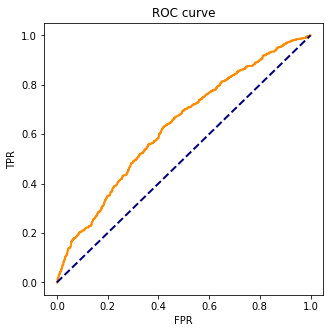

In [22]:
roc_auc_score(valid_y, log_reg.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, log_prob[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [23]:
# Confusion matrices for multiple predictors logistic model. 

# Identify and display confusion matrix for training partition. 
print('Training Partition')
classificationSummary(train_y, log_reg.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition')
classificationSummary(valid_y, log_reg.predict(valid_X_s))
print(classification_report(valid_y, log_reg.predict(valid_X_s)))

Training Partition
Confusion Matrix (Accuracy 0.6257)

       Prediction
Actual    0    1
     0  891  946
     1  599 1692

Validation Partition
Confusion Matrix (Accuracy 0.6040)

       Prediction
Actual   0   1
     0 396 421
     1 280 673
              precision    recall  f1-score   support

           0       0.59      0.48      0.53       817
           1       0.62      0.71      0.66       953

    accuracy                           0.60      1770
   macro avg       0.60      0.60      0.59      1770
weighted avg       0.60      0.60      0.60      1770



<AxesSubplot:>

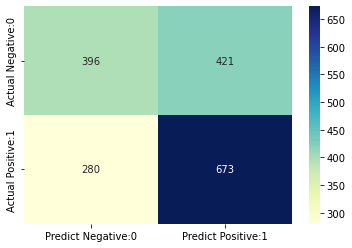

In [24]:
cm = confusion_matrix(valid_y, log_reg.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# KNN Classifier

In [25]:
# Apply NearestNeighbors() function for k=3 in training 
# parition. 
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(train_X_s, train_y)

KNeighborsClassifier(n_neighbors=3)

In [26]:
# Make EV intention classification for validation set 
# using EV intention KNN model. 

# Use knn model to classify EV intention
# for validation set.
EV_pred_knn = knn.predict(valid_X_s)

# Predict EV intention probabilities p(0), p(1),
# and p(2) for validation set.
EV_pred_prob_knn = np.round(knn.predict_proba(valid_X_s), 
                          decimals=4)

# Create data frame to display classification results for
# validation set. 
EV_pred_knn_result = pd.DataFrame({'Actual': valid_y, 
                'p(0)': [p[0] for p in EV_pred_prob_knn],
                'p(1)': [p[1] for p in EV_pred_prob_knn],
                'Classification': EV_pred_knn})

print('Classification for EV intention Data for Validation Partition')
print(EV_pred_knn_result.head(10))

Classification for EV intention Data for Validation Partition
     Actual    p(0)    p(1)  Classification
573       1  0.0000  1.0000               1
3219      1  0.0000  1.0000               1
4436      0  0.6667  0.3333               0
3887      1  0.6667  0.3333               0
3656      1  0.0000  1.0000               1
3680      1  0.3333  0.6667               1
1513      1  0.3333  0.6667               1
79        1  0.3333  0.6667               1
4072      1  0.6667  0.3333               0
3259      0  0.6667  0.3333               0


In [27]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, knn.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.7628734101291933


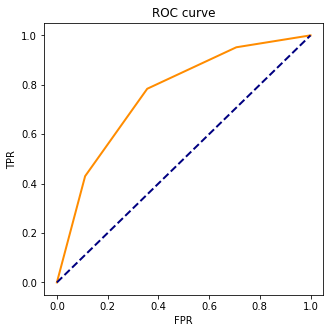

In [28]:
roc_auc_score(valid_y, knn.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, EV_pred_prob_knn[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [29]:
# Confusion matrices for multiple predictors logistic model. 

# Identify and display confusion matrix for training partition. 
print('Training Partition')
classificationSummary(train_y, knn.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition')
classificationSummary(valid_y, knn.predict(valid_X_s))
print(classification_report(valid_y, knn.predict(valid_X_s)))

Training Partition
Confusion Matrix (Accuracy 0.8704)

       Prediction
Actual    0    1
     0 1549  288
     1  247 2044

Validation Partition
Confusion Matrix (Accuracy 0.7192)

       Prediction
Actual   0   1
     0 526 291
     1 206 747
              precision    recall  f1-score   support

           0       0.72      0.64      0.68       817
           1       0.72      0.78      0.75       953

    accuracy                           0.72      1770
   macro avg       0.72      0.71      0.71      1770
weighted avg       0.72      0.72      0.72      1770



<AxesSubplot:>

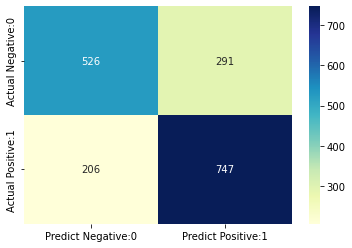

In [30]:
cm = confusion_matrix(valid_y, knn.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

In [31]:
# Identify best k value for number of nearest neighbors using 
# validation partition.

# Develop k-NN classifier using training partition for various
# values of k and then identify accuracy score using validation
# partition. Accuracy score (accuracy) means a probability of 
# correct predictions with the k-NN classifier. 
results = []
for k in range(1, 15):
    # Train knn classifier using training partition.
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X_s, train_y)
    results.append({
        'k': k,
        # For each k, identify accuracy score using validation 
        # partition.
        'Accuracy Score': accuracy_score(valid_y, knn.predict(valid_X_s))
    })

# Convert results to a pandas data frame. The smallest k value 
# with the highest accuracy is the best k to apply in k-NN 
# classifier. 
results = pd.DataFrame(results)
print(results)

     k  Accuracy Score
0    1        0.735593
1    2        0.689266
2    3        0.719209
3    4        0.706780
4    5        0.687006
5    6        0.688136
6    7        0.675706
7    8        0.670056
8    9        0.662712
9   10        0.654237
10  11        0.657627
11  12        0.657062
12  13        0.655367
13  14        0.649718


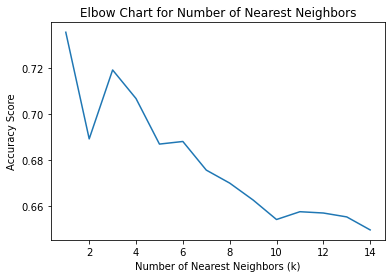

In [32]:
# Develop and display Elbow chart to compare accuracy_score with 
# number of nearest neighbors, k, from 1 to 20. 
ax = results.plot(x='k', y='Accuracy Score')
plt.xlabel('Number of Nearest Neighbors (k)')
plt.ylabel('Accuracy Score')

plt.title('Elbow Chart for Number of Nearest Neighbors')
ax.legend().set_visible(False)
plt.show()

## <font color= "Orange">Different Classification Tree Models:
<ol>
  <font color= "Blue"><li>Full Classification tree</li>
      <li>Smaller Classification tree using random controlled parameters</li>
      <li>Smaller Classification tree using Grid Search results</li>
</ol>

In [33]:
# Grow full classification tree using training partition.
fullClassTree = DecisionTreeClassifier()
fullClassTree.fit(train_X_s, train_y)

# Using plotDecisionTree() to visualize the full tree.
plotDecisionTree(fullClassTree, feature_names=train_X_s.columns)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.67713 to fit



In [34]:
# Indetify and display number of nodes in the tree.
tree_nodes = fullClassTree.tree_.node_count
print('Number of nodes:', tree_nodes)

Number of nodes: 2003


In [35]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, fullClassTree.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.61572422845591


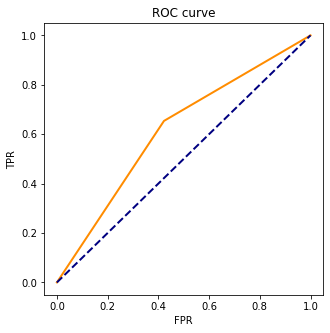

In [36]:
roc_auc_score(valid_y, fullClassTree.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, fullClassTree.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [37]:
# Confusion matrices for full classification tree. 

# Identify  and display confusion matrix for training partition. 
print('Training Partition')
classificationSummary(train_y, fullClassTree.predict(train_X_s))

# Identify  and display confusion matrix for validation partition. 
print()
print('Validation Partition')
classificationSummary(valid_y, fullClassTree.predict(valid_X_s))
print(classification_report(valid_y, fullClassTree.predict(valid_X_s)))


Training Partition
Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual    0    1
     0 1837    0
     1    0 2291

Validation Partition
Confusion Matrix (Accuracy 0.6186)

       Prediction
Actual   0   1
     0 472 345
     1 330 623
              precision    recall  f1-score   support

           0       0.59      0.58      0.58       817
           1       0.64      0.65      0.65       953

    accuracy                           0.62      1770
   macro avg       0.62      0.62      0.62      1770
weighted avg       0.62      0.62      0.62      1770



<AxesSubplot:>

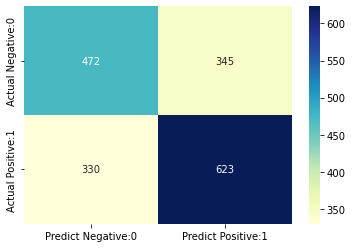

In [38]:
cm = confusion_matrix(valid_y, fullClassTree.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Smaller classification tree using DecisionTreeClassifier() control parameters

Small Classification Tree with Control Parameters


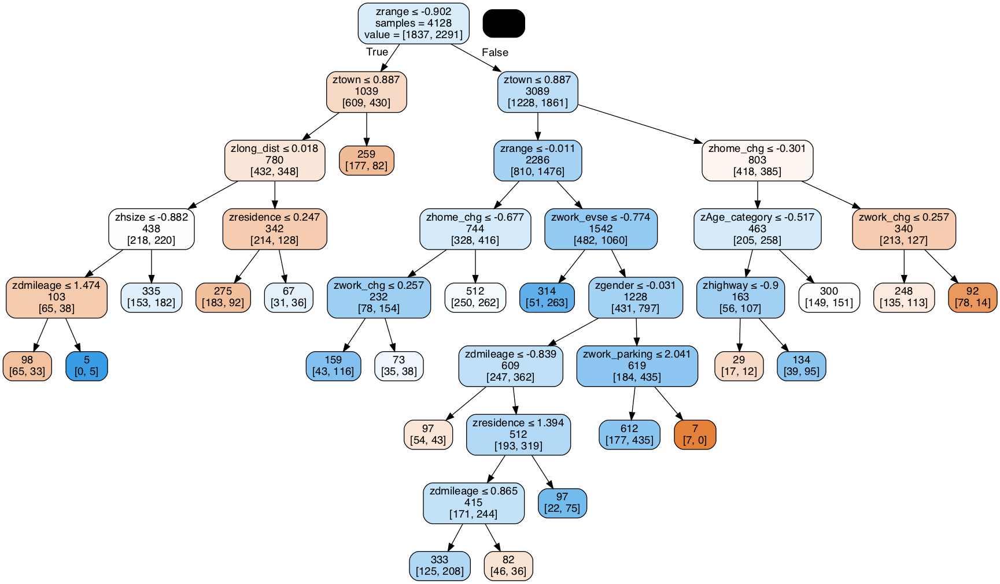

In [39]:
# Create a smaller classification tree for training partition
# using DecisionTreeClassifier() function control parameters:
#  - Maximum Tree depth (number of splits) = 30;
#  - Minimum impurity decrease per split = 0.001 
#  - Minimum number of sample records in a node for splitting = 20.   
smallClassTree = DecisionTreeClassifier(max_depth=30, 
        min_impurity_decrease=0.001, min_samples_split=20)
smallClassTree.fit(train_X_s, train_y)

# Display classification tree for training partition.
print('Small Classification Tree with Control Parameters')
plotDecisionTree(smallClassTree, feature_names=train_X_s.columns)

In [40]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, smallClassTree.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.631671420920343


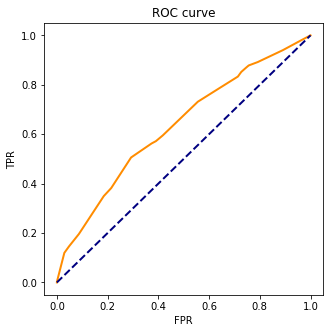

In [41]:
roc_auc_score(valid_y, smallClassTree.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, smallClassTree.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [42]:
# Confusion matrices for smaller classification tree. 

# Identify  and display confusion matrix for training partition. 
print('Training Partition for Smaller Tree with control parameters')
classificationSummary(train_y, smallClassTree.predict(train_X_s))

# Identify  and display confusion matrix for validation partition. 
print()
print('Validation Partition for Smaller Tree with control parameters')
classificationSummary(valid_y, smallClassTree.predict(valid_X_s))
print(classification_report(valid_y, smallClassTree.predict(valid_X_s)))


Training Partition for Smaller Tree with control parameters
Confusion Matrix (Accuracy 0.6366)

       Prediction
Actual    0    1
     0  762 1075
     1  425 1866

Validation Partition for Smaller Tree with control parameters
Confusion Matrix (Accuracy 0.5893)

       Prediction
Actual   0   1
     0 294 523
     1 204 749
              precision    recall  f1-score   support

           0       0.59      0.36      0.45       817
           1       0.59      0.79      0.67       953

    accuracy                           0.59      1770
   macro avg       0.59      0.57      0.56      1770
weighted avg       0.59      0.59      0.57      1770



<AxesSubplot:>

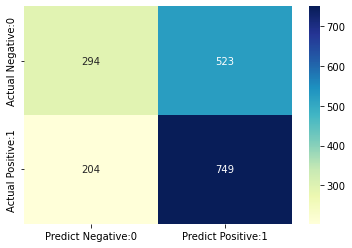

In [43]:
cm = confusion_matrix(valid_y, smallClassTree.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Smaller Classification tree using Grid Search results

In [44]:
# Improve grid search parameters by adapting grid based 
# on results from initial grid search parameters.
param_grid = {
    'max_depth': list(range(10, 30)),  
    'min_impurity_decrease': [0.0005,0, 0.001], 
    'min_samples_split': list(range(10, 30)),
}

# Apply GridSearchCV() fucntion for various combinations of
# DecisionTreeClassifier() improved parameters. 
gridSearch = GridSearchCV(DecisionTreeClassifier(), 
                param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X_s, train_y)

# Display best improved paramenters of classification tree. 
print()
print(f'Improved score:{gridSearch.best_score_:.4f}')
print('Improved parameters: ', gridSearch.best_params_)


Improved score:0.6127
Improved parameters:  {'max_depth': 29, 'min_impurity_decrease': 0.0005, 'min_samples_split': 13}


Best Classification Tree with Grid Search


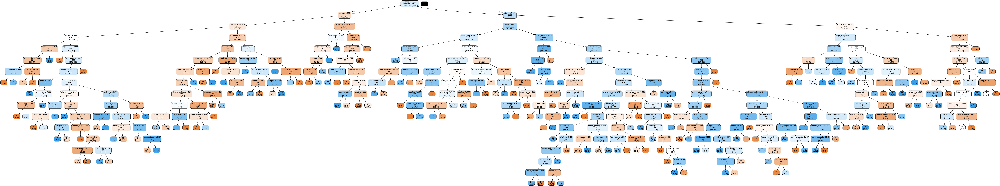

In [45]:
# Create classification tree based on the improved parameters.
bestClassTree = gridSearch.best_estimator_

# Display classification tree based on improved parameters
print('Best Classification Tree with Grid Search')
plotDecisionTree(bestClassTree, feature_names=train_X_s.columns)

In [46]:
# Identify and display number of nodes in the tree
# based on grid search.
tree_nodes_grid = bestClassTree.tree_.node_count
print('Number of nodes:', tree_nodes_grid)

Number of nodes: 409


In [47]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, gridSearch.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.6403453116551353


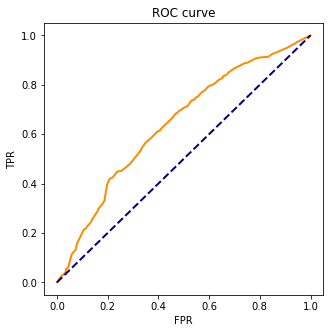

In [48]:
roc_auc_score(valid_y, gridSearch.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, gridSearch.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [49]:
# Confusion matrices for grid search classification tree. 

# Identify and display confusion matrix for training partition. 
print('Training Partition for classification tree based on grid search')
classificationSummary(train_y, bestClassTree.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition for classification tree based on grid search')
classificationSummary(valid_y, bestClassTree.predict(valid_X_s))
print(classification_report(valid_y, bestClassTree.predict(valid_X_s)))

Training Partition for classification tree based on grid search
Confusion Matrix (Accuracy 0.7873)

       Prediction
Actual    0    1
     0 1309  528
     1  350 1941

Validation Partition for classification tree based on grid search
Confusion Matrix (Accuracy 0.6130)

       Prediction
Actual   0   1
     0 423 394
     1 291 662
              precision    recall  f1-score   support

           0       0.59      0.52      0.55       817
           1       0.63      0.69      0.66       953

    accuracy                           0.61      1770
   macro avg       0.61      0.61      0.61      1770
weighted avg       0.61      0.61      0.61      1770



<AxesSubplot:>

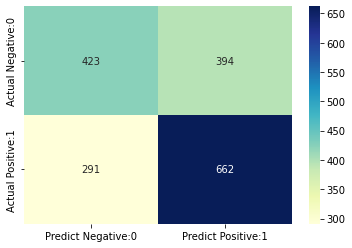

In [50]:
cm = confusion_matrix(valid_y, bestClassTree.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Random Forest trees

In [51]:
# Apply RandomForestClassifier() function to develop a combined
# (ensemble) classification tree using Random Forest algorithm.
rf = RandomForestClassifier(n_estimators=1000, random_state=1)
rf.fit(train_X_s, train_y)

# Display number of nodes in Random Forest trees.
n_nodes = rf.estimators_[0].tree_.node_count
print('Number of Nodes in Tree in Random Forest:', n_nodes)

Number of Nodes in Tree in Random Forest: 1985


In [52]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, rf.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.8169376869539084


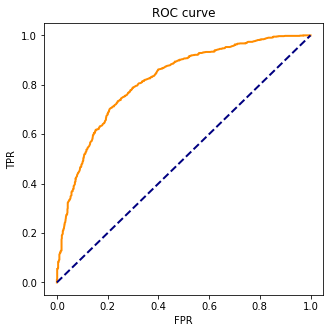

In [53]:
roc_auc_score(valid_y, rf.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, rf.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [54]:
# Confusion matrices for Random Forest classification. 

# Identify  and display confusion matrix for training partition. 
print('Training Partition for Random Forest Tree')
classificationSummary(train_y, rf.predict(train_X_s))

# Identify  and display confusion matrix for validation partition. 
print()
print('Validation Partition for Random Forest Tree')
classificationSummary(valid_y, rf.predict(valid_X_s))
print(classification_report(valid_y, rf.predict(valid_X_s)))


Training Partition for Random Forest Tree
Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual    0    1
     0 1837    0
     1    0 2291

Validation Partition for Random Forest Tree
Confusion Matrix (Accuracy 0.7418)

       Prediction
Actual   0   1
     0 531 286
     1 171 782
              precision    recall  f1-score   support

           0       0.76      0.65      0.70       817
           1       0.73      0.82      0.77       953

    accuracy                           0.74      1770
   macro avg       0.74      0.74      0.74      1770
weighted avg       0.74      0.74      0.74      1770



<AxesSubplot:title={'center':'Confusion Matrix'}>

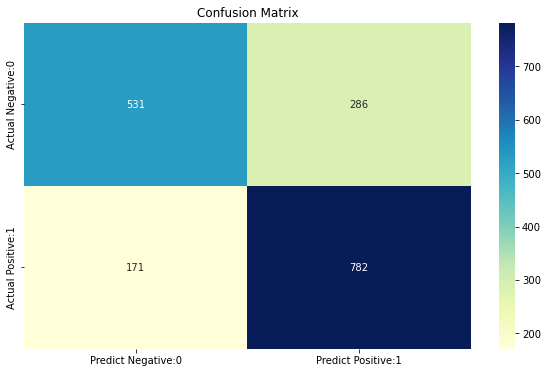

In [55]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_title('Confusion Matrix')
cm = confusion_matrix(valid_y, rf.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Boosted Tree

In [56]:
# Apply GradientBoostingClassifier() function to develop a combined
# boosted tree.  
boost = GradientBoostingClassifier(learning_rate=0.05, n_estimators=500, random_state=1,
                           subsample=0.7)
boost.fit(train_X_s, train_y)

GradientBoostingClassifier(learning_rate=0.05, n_estimators=500, random_state=1,
                           subsample=0.7)

In [57]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, boost.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.7558068895364892


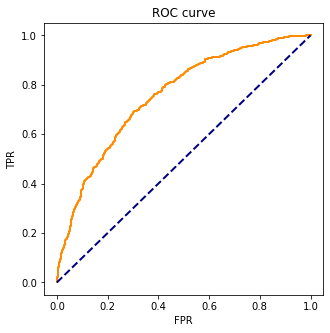

In [58]:
roc_auc_score(valid_y, boost.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, boost.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [59]:
# Confusion matrices for Boosted Tree classification. 

# Identify  and show confusion matrix for training partition. 
print('Training Partition for Boosted Tree')
classificationSummary(train_y, boost.predict(train_X_s))

# Identify  and show confusion matrix for validation partition. 
print()
print('Validation Partition for Boosted Tree')
classificationSummary(valid_y, boost.predict(valid_X_s))
print(classification_report(valid_y, boost.predict(valid_X_s)))

Training Partition for Boosted Tree
Confusion Matrix (Accuracy 0.8144)

       Prediction
Actual    0    1
     0 1350  487
     1  279 2012

Validation Partition for Boosted Tree
Confusion Matrix (Accuracy 0.6910)

       Prediction
Actual   0   1
     0 487 330
     1 217 736
              precision    recall  f1-score   support

           0       0.69      0.60      0.64       817
           1       0.69      0.77      0.73       953

    accuracy                           0.69      1770
   macro avg       0.69      0.68      0.68      1770
weighted avg       0.69      0.69      0.69      1770



<AxesSubplot:>

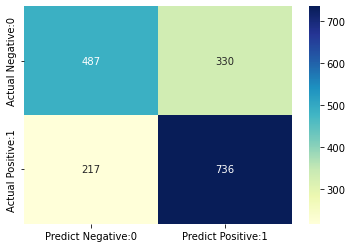

In [60]:
cm = confusion_matrix(valid_y, boost.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# XGboost

In [61]:
xgbc = XGBClassifier(n_estimators=1000, random_state=1,enable_categorical= False)
xgbc.fit(train_X_s, train_y)


[13:46:08] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=1000, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [62]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, xgbc.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.8008363719029388


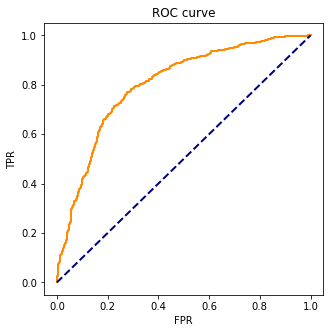

In [63]:
roc_auc_score(valid_y, xgbc.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, xgbc.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [64]:
# Confusion matrices for XGBoosted Tree classification. 

# Identify  and show confusion matrix for training partition. 
print('Training Partition for XGBoosted Tree')
classificationSummary(train_y, xgbc.predict(train_X_s))

# Identify  and show confusion matrix for validation partition. 
print()
print('Validation Partition for XGBoosted Tree')
classificationSummary(valid_y, xgbc.predict(valid_X_s))
print(classification_report(valid_y, xgbc.predict(valid_X_s)))

Training Partition for XGBoosted Tree
Confusion Matrix (Accuracy 1.0000)

       Prediction
Actual    0    1
     0 1837    0
     1    0 2291

Validation Partition for XGBoosted Tree
Confusion Matrix (Accuracy 0.7469)

       Prediction
Actual   0   1
     0 569 248
     1 200 753
              precision    recall  f1-score   support

           0       0.74      0.70      0.72       817
           1       0.75      0.79      0.77       953

    accuracy                           0.75      1770
   macro avg       0.75      0.74      0.74      1770
weighted avg       0.75      0.75      0.75      1770



<AxesSubplot:>

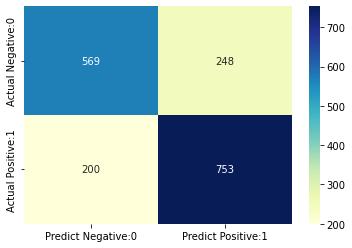

In [65]:
cm = confusion_matrix(valid_y, xgbc.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# LightGBM

In [66]:
lgbmc = LGBMClassifier(random_state=1,
                n_estimators=500,                
                learning_rate=0.05,      
                subsample=0.7)
lgbmc.fit(train_X_s, train_y)


LGBMClassifier(learning_rate=0.05, n_estimators=500, random_state=1,
               subsample=0.7)

In [67]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, lgbmc.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.8063462543716231


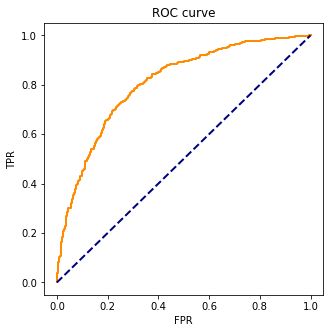

In [68]:
roc_auc_score(valid_y, lgbmc.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, lgbmc.predict_proba(valid_X_s)[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [69]:
classificationSummary(train_y, lgbmc.predict(train_X_s))

classificationSummary(valid_y, lgbmc.predict(valid_X_s))
print(classification_report(valid_y, lgbmc.predict(valid_X_s)))

Confusion Matrix (Accuracy 0.9792)

       Prediction
Actual    0    1
     0 1767   70
     1   16 2275
Confusion Matrix (Accuracy 0.7384)

       Prediction
Actual   0   1
     0 535 282
     1 181 772
              precision    recall  f1-score   support

           0       0.75      0.65      0.70       817
           1       0.73      0.81      0.77       953

    accuracy                           0.74      1770
   macro avg       0.74      0.73      0.73      1770
weighted avg       0.74      0.74      0.74      1770



<AxesSubplot:>

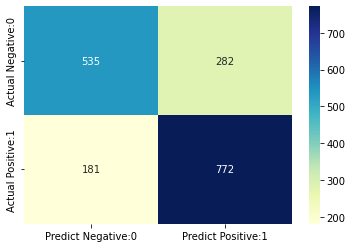

In [70]:
cm = confusion_matrix(valid_y, lgbmc.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Neural Network Model

## <font color= "Orange">Different Neural Network Models:
<ol>
  <font color= "Blue"><li>Neural Network Model using multiple Predictors</li>
      <li>Neural Network Model Based on Grid Search</li>
</ol>

## Neural network Model 

In [71]:

# Use MLPCclassifier() function to train neural network model.
# Apply: 
# (a) default input layer with the number of nodes equal 
#     to number of predictor variables (20); 
# (b) single hidden layer with 3 nodes (default is 2); 
# (c) default output layer with the number nodes equal
#     to number of classes in outcome variable (2);
# (d) 'logistic' activation function;
# (e) solver = 'lbfgs', which is applied for small data 
#     sets for better performance and fast convergence. 
#     For large data sets, apply default solver = 'adam'. 
EV_intention_clf = MLPClassifier(hidden_layer_sizes=(3), max_iter=10000,activation='logistic',
                    solver='lbfgs', random_state=1)
EV_intention_clf.fit(train_X_s, train_y)

# Display network structure with the final values of 
# intercepts (Theta) and weights (W).
print('Final Intercepts for EV intention Neural Network Model')
print(EV_intention_clf.intercepts_)

print()
print('Network Weights for EV intention Neural Network Model')
print(EV_intention_clf.coefs_)

Final Intercepts for EV intention Neural Network Model
[array([-59.22412531,  -1.61779503, -83.58439141]), array([-2.51477561])]

Network Weights for EV intention Neural Network Model
[array([[ 1.49469317e+01,  1.99672839e-01,  2.18880259e+01],
       [-5.03244792e-01, -1.08548959e-01, -2.21448336e+01],
       [-7.63532113e+00, -8.60335501e-02, -1.90818578e+01],
       [-2.31761763e+01, -1.06036439e-01, -1.88338884e+01],
       [-1.11247225e+01,  3.74102671e-02,  1.06858360e+01],
       [ 6.60795083e+01,  5.93551366e-02,  6.57426515e+01],
       [ 3.73523874e+01,  2.24626321e-02,  6.81880416e+01],
       [ 3.46681254e+00,  2.98230203e-02,  4.03111463e+00],
       [-8.32439398e+00,  4.30491552e-02, -1.11827199e+01],
       [-3.40414785e+01,  1.63235312e-01,  1.00428176e+02],
       [-3.46843801e+01, -1.07527782e-01, -1.10565278e+02],
       [ 3.14417971e+01, -1.32011488e-01, -1.28631653e+01],
       [ 6.02114681e+01,  7.16755824e-02,  1.15898073e+02],
       [ 4.97018686e+01,  1.4878122

In [72]:
# Make Ev intention classification for validation set 
# using EV intention neural network model. 

# Use EV_intention_clf model to classify EV intention
# for validation set.
EV_Intention_pred = EV_intention_clf.predict(valid_X_s)

# Predict target probabilities p(0), p(1),
# and p(2) for validation set.
EV_pred_prob = np.round(EV_intention_clf.predict_proba(valid_X_s), 
                          decimals=4)

# Create data frame to display classification results for
# validation set. 
EV_pred_result = pd.DataFrame({'Actual': valid_y, 
                'p(0)': [p[0] for p in EV_pred_prob],
                'p(1)': [p[1] for p in EV_pred_prob],
                'Classification': EV_Intention_pred})

print('Classification for EV intention data for Validation Partition')
print(EV_pred_result.head(10))

Classification for EV intention data for Validation Partition
     Actual    p(0)    p(1)  Classification
573       1  0.4202  0.5798               1
3219      1  0.7644  0.2356               0
4436      0  0.2565  0.7435               1
3887      1  0.4892  0.5108               1
3656      1  0.1142  0.8858               1
3680      1  0.4278  0.5722               1
1513      1  0.2222  0.7778               1
79        1  0.1524  0.8476               1
4072      1  0.1396  0.8604               1
3259      0  0.5963  0.4037               0


In [73]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, EV_intention_clf.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.6399195480098279


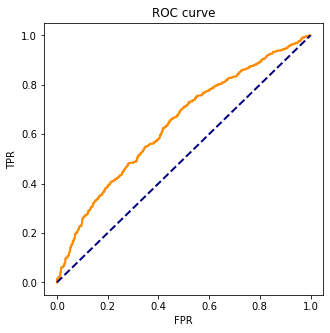

In [74]:
roc_auc_score(valid_y, EV_intention_clf.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, EV_pred_prob[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [75]:
# Confusion matrices for EV intention neural network model. 

# Identify and display confusion matrix for training partition. 
print('Training Partition for Neural Network Model')
classificationSummary(train_y, EV_intention_clf.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition for Neural Network Model')
classificationSummary(valid_y, EV_intention_clf.predict(valid_X_s))
print(classification_report(valid_y, EV_intention_clf.predict(valid_X_s)))

Training Partition for Neural Network Model
Confusion Matrix (Accuracy 0.6827)

       Prediction
Actual    0    1
     0 1149  688
     1  622 1669

Validation Partition for Neural Network Model
Confusion Matrix (Accuracy 0.6079)

       Prediction
Actual   0   1
     0 442 375
     1 319 634
              precision    recall  f1-score   support

           0       0.58      0.54      0.56       817
           1       0.63      0.67      0.65       953

    accuracy                           0.61      1770
   macro avg       0.60      0.60      0.60      1770
weighted avg       0.61      0.61      0.61      1770



<AxesSubplot:>

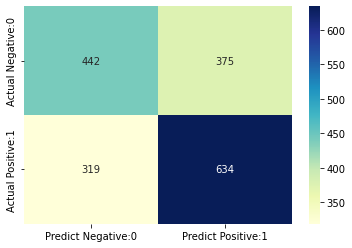

In [76]:
cm = confusion_matrix(valid_y, EV_intention_clf.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

## Neural network Model using Grid Search

In [77]:
# Identify grid search parameters. 
param_grid = {
    'hidden_layer_sizes': list(range(2, 20)), 
}

# Utilize GridSearchCV() to identify the best number 
# of nodes in the hidden layer. 
gridSearch = GridSearchCV(MLPClassifier(solver='lbfgs', max_iter=10000, random_state=1), 
                          param_grid, cv=5, n_jobs=-1, return_train_score=True)
gridSearch.fit(train_X_s, train_y)

# Display the best score and best parament value.
print(f'Best score:{gridSearch.best_score_:.4f}')
print('Best parameter: ', gridSearch.best_params_)

Best score:0.6684
Best parameter:  {'hidden_layer_sizes': 17}


In [78]:
# Use MLPCclassifier() function to train the improved neural network model
# based on grid search results. 

# Apply: 
# (a) default input layer with the number of nodes equal 
#     to number of predictor variables (17); 
# (b) single hidden layer with 10 nodes based on grid search; 
# (c) default output layer with the number nodes equal
#     to number of classes in outcome variable (2);
# (d) 'logistic' activation function;
# (e) solver = 'lbfgs', which is applied for small data 
#     sets for better performance and fast convergence. 
#     For large data sets, apply default solver = 'adam'. 
EV_clf_imp = MLPClassifier(hidden_layer_sizes=(17), max_iter=10000,
                activation='logistic', solver='lbfgs', random_state=1)
EV_clf_imp.fit(train_X_s, train_y)

# Display network structure with the final values of 
# intercepts (Theta) and weights (W).
print('Final Intercepts for EV intention Neural Network Model based on grid search')
print(EV_clf_imp.intercepts_)

print()
print('Network Weights for EV intention Neural Network Model based on grid search')
print(EV_clf_imp.coefs_)

Final Intercepts for EV intention Neural Network Model based on grid search
[array([ -2.17922447,  25.67928466, -18.49887318, -52.53806849,
       -21.68151965,  -0.75769162,  -6.7767742 ,   2.14517407,
        -2.05125299,  46.89742064,  16.09158722, -29.38585114,
       -84.19773724,  51.35571455, -52.50062647,  42.9600813 ,
        24.73688844]), array([-1.15239671])]

Network Weights for EV intention Neural Network Model based on grid search
[array([[-3.12087776e+01,  4.74557945e-02, -3.02833803e+01,
         1.92180817e+00,  6.43084654e+00,  1.41046175e+00,
        -5.52513099e+01, -5.24088596e+01, -4.28778483e+00,
         2.36362704e+00,  3.81781146e+01,  1.73103255e+00,
        -5.39635559e+00,  2.57835632e+00, -1.39676198e+01,
         9.21197052e+00, -1.81098164e+01],
       [ 3.60562090e+01,  6.38785753e+00, -2.34358359e+01,
        -4.10206781e+00, -1.30643669e+01,  7.91405741e-01,
         1.16432425e+01,  1.45770789e+01,  8.54581160e+00,
        -6.92907901e+00, -9.059156

In [79]:
# Make EV intention classification for validation set 
# using EV intention neural network model. 

# Use EV_clf_imp model to classify EV intention
# for validation set.
EV_pred_imp = EV_clf_imp.predict(valid_X_s)

# Predict EV intention probabilities p(0), p(1),
# and p(2) for validation set.
EV_pred_prob_imp = np.round(EV_clf_imp.predict_proba(valid_X_s), 
                          decimals=4)

# Create data frame to display classification results for
# validation set. 
EV_pred_imp_result = pd.DataFrame({'Actual': valid_y, 
                'p(0)': [p[0] for p in EV_pred_prob_imp],
                'p(1)': [p[1] for p in EV_pred_prob_imp],
                'Classification': EV_pred_imp})

print('Classification for EV intention Data for Validation Partition')
print(EV_pred_imp_result.head(10))

Classification for EV intention Data for Validation Partition
     Actual    p(0)    p(1)  Classification
573       1  0.4294  0.5706               1
3219      1  0.4384  0.5616               1
4436      0  0.9577  0.0423               0
3887      1  0.9198  0.0802               0
3656      1  0.1275  0.8725               1
3680      1  0.2059  0.7941               1
1513      1  0.2323  0.7677               1
79        1  0.0402  0.9598               1
4072      1  0.0173  0.9827               1
3259      0  0.8347  0.1653               0


In [80]:
#calculate AUC of model
auc = metrics.roc_auc_score(valid_y, EV_clf_imp.predict_proba(valid_X_s)[:,1])

#print AUC score
print(auc)

0.6944359177550503


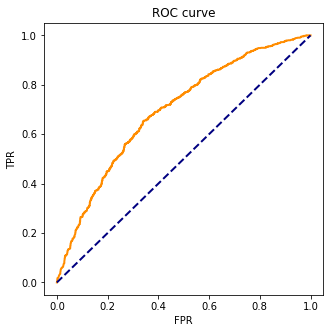

In [81]:
roc_auc_score(valid_y, EV_clf_imp.predict_proba(valid_X_s)[:,1])

fpr, tpr, _ = roc_curve(valid_y, EV_pred_prob_imp[:,1])
plt.figure(figsize=[5, 5])
lw = 2

#plt.clf()
plt.plot(fpr, tpr,color='darkorange',
         lw=lw)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.show()

In [82]:
# Confusion matrices for improved neural network model for EV intention
# using grid search results. 

# Identify and display confusion matrix for training partition. 
print('Training Partition for Neural Network Model based on grid search')
classificationSummary(train_y, EV_clf_imp.predict(train_X_s))

# Identify and display confusion matrix for validation partition. 
print()
print('Validation Partition for Neural Network Model based on grid search')
classificationSummary(valid_y, EV_clf_imp.predict(valid_X_s))
print(classification_report(valid_y, EV_clf_imp.predict(valid_X_s)))

Training Partition for Neural Network Model based on grid search
Confusion Matrix (Accuracy 0.8658)

       Prediction
Actual    0    1
     0 1548  289
     1  265 2026

Validation Partition for Neural Network Model based on grid search
Confusion Matrix (Accuracy 0.6503)

       Prediction
Actual   0   1
     0 491 326
     1 293 660
              precision    recall  f1-score   support

           0       0.63      0.60      0.61       817
           1       0.67      0.69      0.68       953

    accuracy                           0.65      1770
   macro avg       0.65      0.65      0.65      1770
weighted avg       0.65      0.65      0.65      1770



<AxesSubplot:>

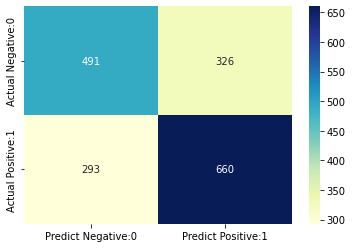

In [83]:
cm = confusion_matrix(valid_y, EV_clf_imp.predict(valid_X_s))
cm_matrix = pd.DataFrame(data=cm, columns= ['Predict Negative:0','Predict Positive:1'], 
                                 index=[ 'Actual Negative:0','Actual Positive:1'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

# Causal analysis

      state bichoice range  home_chg  work_chg town highway gender Region  \
0      20.0        0     1         3         1    3       2      0      1   
1      20.0        0     4         3         3    4       2      0      1   
2      20.0        0     2         5         0    2       4      0      1   
3      20.0        0     4         5         0    1       1      0      1   
4      20.0        0     1         5         0    1       2      0      1   
...     ...      ...   ...       ...       ...  ...     ...    ...    ...   
5893    1.0        0     2        10         5    2       2      0      5   
5894    1.0        1     3         1         3    4       3      0      5   
5895    1.0        0     1        20         2    2       4      0      5   
5896    1.0        0     2        20         5    4       2      0      5   
5897    1.0        0     1         2         1    3       1      0      5   

     education  ... home_parking home_evse work_parking work_evse buycar  \

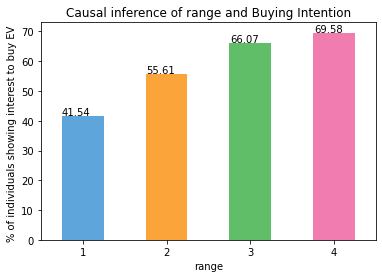

Column name: home_chg
Unique values: [ 0  1  2  3  5 10 20]

The percentage of will buy when feature = home_chg and value = 0 is: 63.93692777212614

The percentage of will buy when feature = home_chg and value = 1 is: 60.52899287894201

The percentage of will buy when feature = home_chg and value = 2 is: 58.443540183112916

The percentage of will buy when feature = home_chg and value = 3 is: 57.15496778569007

The percentage of will buy when feature = home_chg and value = 5 is: 56.83282468633435

The percentage of will buy when feature = home_chg and value = 10 is: 54.272634791454735

The percentage of will buy when feature = home_chg and value = 20 is: 52.91624279416751
   value    column       perc
0      0  home_chg  63.936928
1      1  home_chg  60.528993
2      2  home_chg  58.443540
3      3  home_chg  57.154968
4      5  home_chg  56.832825
5     10  home_chg  54.272635
6     20  home_chg  52.916243


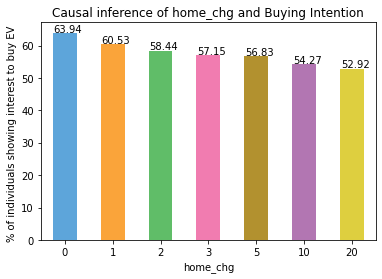

Column name: work_chg
Unique values: [ 0  1  2  3  5 10 20]

The percentage of will buy when feature = work_chg and value = 0 is: 59.71515768056969

The percentage of will buy when feature = work_chg and value = 1 is: 59.37605968124788

The percentage of will buy when feature = work_chg and value = 2 is: 58.39267548321465

The percentage of will buy when feature = work_chg and value = 3 is: 57.79925398440149

The percentage of will buy when feature = work_chg and value = 5 is: 57.39233638521532

The percentage of will buy when feature = work_chg and value = 10 is: 55.069515089860964

The percentage of will buy when feature = work_chg and value = 20 is: 54.035266191929466
   value    column       perc
0      0  work_chg  59.715158
1      1  work_chg  59.376060
2      2  work_chg  58.392675
3      3  work_chg  57.799254
4      5  work_chg  57.392336
5     10  work_chg  55.069515
6     20  work_chg  54.035266


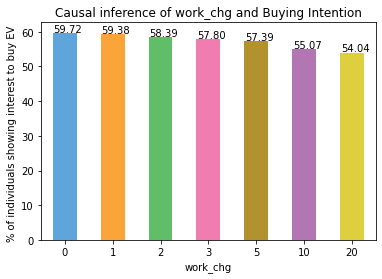

Column name: town
Unique values: [1 2 3 4]

The percentage of will buy when feature = town and value = 1 is: 62.83485927433028

The percentage of will buy when feature = town and value = 2 is: 62.2753475754493

The percentage of will buy when feature = town and value = 3 is: 60.80027127839946

The percentage of will buy when feature = town and value = 4 is: 45.11698880976602
   value column       perc
0      1   town  62.834859
1      2   town  62.275348
2      3   town  60.800271
3      4   town  45.116989


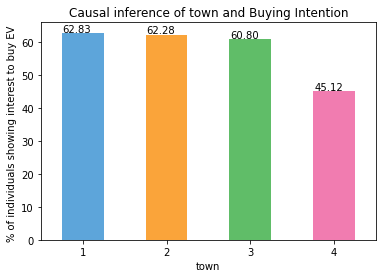

Column name: highway
Unique values: [1 2 3 4]

The percentage of will buy when feature = highway and value = 1 is: 57.35842658528315

The percentage of will buy when feature = highway and value = 2 is: 57.07019328585962

The percentage of will buy when feature = highway and value = 3 is: 57.34147168531706

The percentage of will buy when feature = highway and value = 4 is: 57.527975584944045
   value   column       perc
0      1  highway  57.358427
1      2  highway  57.070193
2      3  highway  57.341472
3      4  highway  57.527976


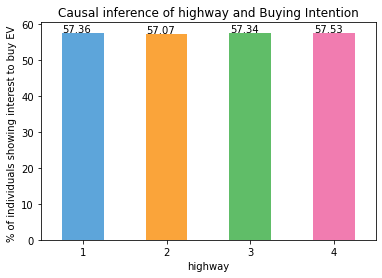

Column name: gender
Unique values: [0 1]

The percentage of will buy when feature = gender and value = 0 is: 56.00203458799593

The percentage of will buy when feature = gender and value = 1 is: 59.46083418107834
   value  column       perc
0      0  gender  56.002035
1      1  gender  59.460834


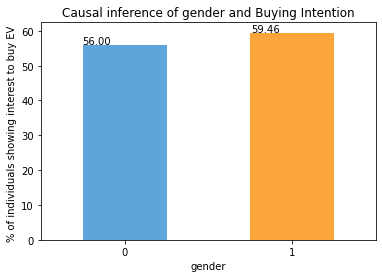

Column name: Region
Unique values: [1 2 3 4 5]

The percentage of will buy when feature = Region and value = 1 is: 56.697185486605626

The percentage of will buy when feature = Region and value = 2 is: 56.934554086130895

The percentage of will buy when feature = Region and value = 3 is: 56.934554086130895

The percentage of will buy when feature = Region and value = 4 is: 57.01932858596134

The percentage of will buy when feature = Region and value = 5 is: 58.290946083418106
   value  column       perc
0      1  Region  56.697185
1      2  Region  56.934554
2      3  Region  56.934554
3      4  Region  57.019329
4      5  Region  58.290946


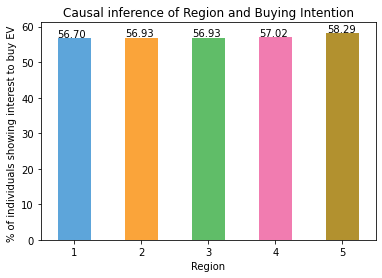

Column name: education
Unique values: [1 2 3 4]

The percentage of will buy when feature = education and value = 1 is: 55.47643268904714

The percentage of will buy when feature = education and value = 2 is: 57.239742285520514

The percentage of will buy when feature = education and value = 3 is: 57.561885384876234

The percentage of will buy when feature = education and value = 4 is: 57.375381485249235
   value     column       perc
0      1  education  55.476433
1      2  education  57.239742
2      3  education  57.561885
3      4  education  57.375381


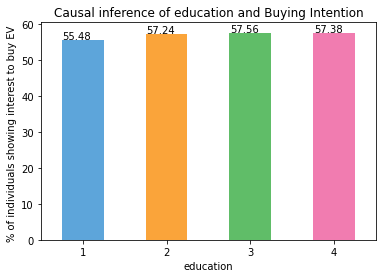

Column name: employment
Unique values: [1 2 3 4 5 6]

The percentage of will buy when feature = employment and value = 1 is: 56.79891488640217

The percentage of will buy when feature = employment and value = 2 is: 56.731095286537816

The percentage of will buy when feature = employment and value = 3 is: 57.2566971854866

The percentage of will buy when feature = employment and value = 4 is: 57.47711088504578

The percentage of will buy when feature = employment and value = 5 is: 57.81620888436758

The percentage of will buy when feature = employment and value = 6 is: 57.188877585622244
   value      column       perc
0      1  employment  56.798915
1      2  employment  56.731095
2      3  employment  57.256697
3      4  employment  57.477111
4      5  employment  57.816209
5      6  employment  57.188878


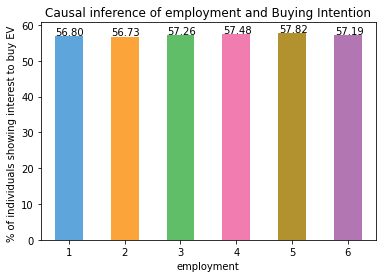

Column name: hsincome
Unique values: [1 2 3 4 5]

The percentage of will buy when feature = hsincome and value = 1 is: 56.951508986096975

The percentage of will buy when feature = hsincome and value = 2 is: 56.88368938623262

The percentage of will buy when feature = hsincome and value = 3 is: 57.66361478467277

The percentage of will buy when feature = hsincome and value = 4 is: 57.138012885723974

The percentage of will buy when feature = hsincome and value = 5 is: 57.01932858596134
   value    column       perc
0      1  hsincome  56.951509
1      2  hsincome  56.883689
2      3  hsincome  57.663615
3      4  hsincome  57.138013
4      5  hsincome  57.019329


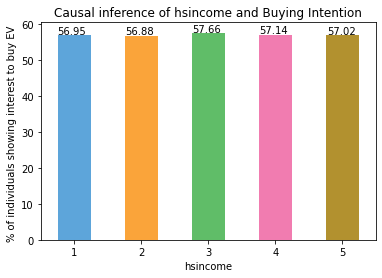

Column name: hsize
Unique values: [1 2 3 4 5]

The percentage of will buy when feature = hsize and value = 1 is: 58.05357748389285

The percentage of will buy when feature = hsize and value = 2 is: 59.47778908104442

The percentage of will buy when feature = hsize and value = 3 is: 58.07053238385893

The percentage of will buy when feature = hsize and value = 4 is: 55.6968463886063

The percentage of will buy when feature = hsize and value = 5 is: 55.79857578840285
   value column       perc
0      1  hsize  58.053577
1      2  hsize  59.477789
2      3  hsize  58.070532
3      4  hsize  55.696846
4      5  hsize  55.798576


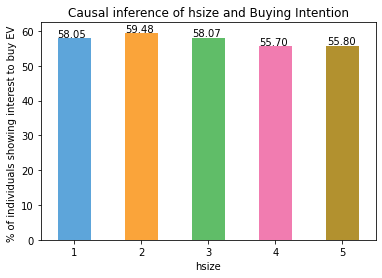

Column name: housit
Unique values: [1 2 3 4]

The percentage of will buy when feature = housit and value = 1 is: 57.17192268565615

The percentage of will buy when feature = housit and value = 2 is: 56.748050186503896

The percentage of will buy when feature = housit and value = 3 is: 55.74771108850458

The percentage of will buy when feature = housit and value = 4 is: 55.7138012885724
   value  column       perc
0      1  housit  57.171923
1      2  housit  56.748050
2      3  housit  55.747711
3      4  housit  55.713801


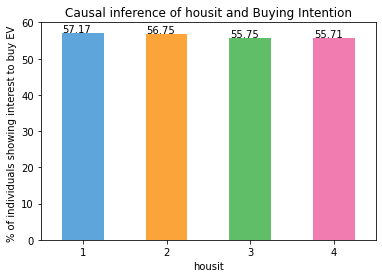

Column name: residence
Unique values: [1 2 3 4 5 6 8]

The percentage of will buy when feature = residence and value = 1 is: 57.188877585622244

The percentage of will buy when feature = residence and value = 2 is: 56.731095286537816

The percentage of will buy when feature = residence and value = 3 is: 57.00237368599525

The percentage of will buy when feature = residence and value = 4 is: 57.561885384876234

The percentage of will buy when feature = residence and value = 5 is: 57.30756188538487

The percentage of will buy when feature = residence and value = 6 is: 57.30756188538487

The percentage of will buy when feature = residence and value = 8 is: 57.375381485249235
   value     column       perc
0      1  residence  57.188878
1      2  residence  56.731095
2      3  residence  57.002374
3      4  residence  57.561885
4      5  residence  57.307562
5      6  residence  57.307562
6      8  residence  57.375381


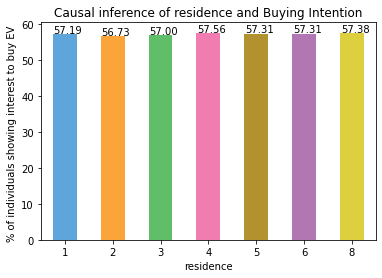

Column name: all_cars
Unique values: [1 2 3 4]

The percentage of will buy when feature = all_cars and value = 1 is: 57.121057985757886

The percentage of will buy when feature = all_cars and value = 2 is: 57.34147168531706

The percentage of will buy when feature = all_cars and value = 3 is: 55.578162088843676

The percentage of will buy when feature = all_cars and value = 4 is: 54.64564259070871
   value    column       perc
0      1  all_cars  57.121058
1      2  all_cars  57.341472
2      3  all_cars  55.578162
3      4  all_cars  54.645643


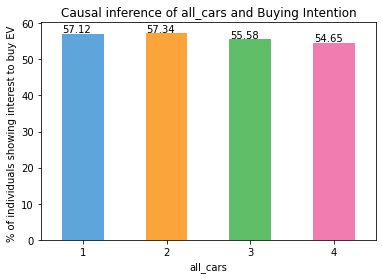

Column name: ev_cars
Unique values: [0 1 2 4]

The percentage of will buy when feature = ev_cars and value = 0 is: 56.86673448626654

The percentage of will buy when feature = ev_cars and value = 1 is: 60.88504577822991

The percentage of will buy when feature = ev_cars and value = 2 is: 61.15632417768735

The percentage of will buy when feature = ev_cars and value = 4 is: 61.17327907765344
   value   column       perc
0      0  ev_cars  56.866734
1      1  ev_cars  60.885046
2      2  ev_cars  61.156324
3      4  ev_cars  61.173279


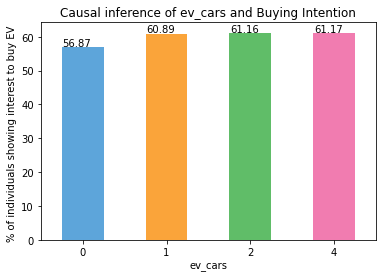

Column name: home_parking
Unique values: [1 2 3 4 5 6]

The percentage of will buy when feature = home_parking and value = 1 is: 56.2224482875551

The percentage of will buy when feature = home_parking and value = 2 is: 56.731095286537816

The percentage of will buy when feature = home_parking and value = 3 is: 57.47711088504578

The percentage of will buy when feature = home_parking and value = 4 is: 57.79925398440149

The percentage of will buy when feature = home_parking and value = 5 is: 57.850118684299765

The percentage of will buy when feature = home_parking and value = 6 is: 57.49406578501187
   value        column       perc
0      1  home_parking  56.222448
1      2  home_parking  56.731095
2      3  home_parking  57.477111
3      4  home_parking  57.799254
4      5  home_parking  57.850119
5      6  home_parking  57.494066


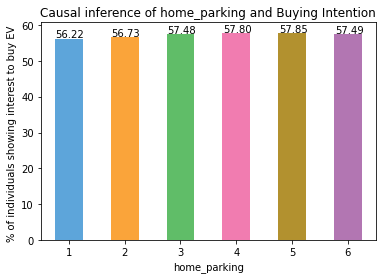

Column name: home_evse
Unique values: [1 2 3]

The percentage of will buy when feature = home_evse and value = 1 is: 57.07019328585962

The percentage of will buy when feature = home_evse and value = 2 is: 56.951508986096975

The percentage of will buy when feature = home_evse and value = 3 is: 58.13835198372329
   value     column       perc
0      1  home_evse  57.070193
1      2  home_evse  56.951509
2      3  home_evse  58.138352


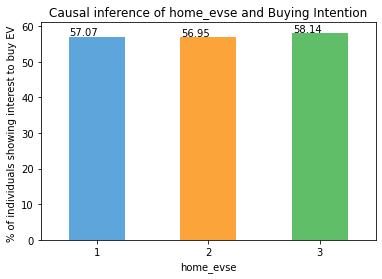

Column name: work_parking
Unique values: [1 2 3 4 5 6]

The percentage of will buy when feature = work_parking and value = 1 is: 58.528314682943375

The percentage of will buy when feature = work_parking and value = 2 is: 57.05323838589352

The percentage of will buy when feature = work_parking and value = 3 is: 56.748050186503896

The percentage of will buy when feature = work_parking and value = 4 is: 56.34113258731773

The percentage of will buy when feature = work_parking and value = 5 is: 56.29026788741947

The percentage of will buy when feature = work_parking and value = 6 is: 54.78128179043744
   value        column       perc
0      1  work_parking  58.528315
1      2  work_parking  57.053238
2      3  work_parking  56.748050
3      4  work_parking  56.341133
4      5  work_parking  56.290268
5      6  work_parking  54.781282


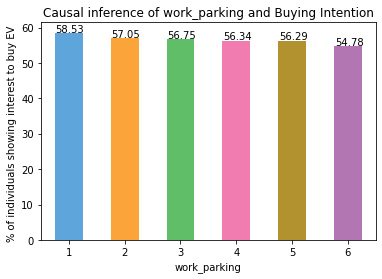

Column name: work_evse
Unique values: [1 2 3]

The percentage of will buy when feature = work_evse and value = 1 is: 62.783994574432015

The percentage of will buy when feature = work_evse and value = 2 is: 56.697185486605626

The percentage of will buy when feature = work_evse and value = 3 is: 57.527975584944045
   value     column       perc
0      1  work_evse  62.783995
1      2  work_evse  56.697185
2      3  work_evse  57.527976


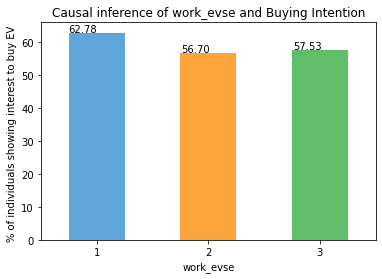

Column name: buycar
Unique values: [1 2 3]

The percentage of will buy when feature = buycar and value = 1 is: 58.13835198372329

The percentage of will buy when feature = buycar and value = 2 is: 56.71414038657172

The percentage of will buy when feature = buycar and value = 3 is: 56.578501186843
   value  column       perc
0      1  buycar  58.138352
1      2  buycar  56.714140
2      3  buycar  56.578501


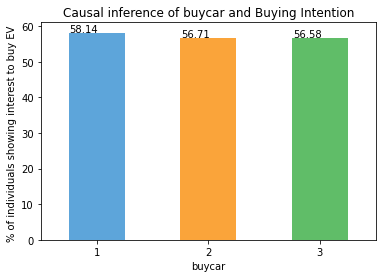

Column name: dmileage
Unique values: [  0   5  10  15  20  25  30  35  40  45  50  55  60  65  70  75  80  85
  90 100]

The percentage of will buy when feature = dmileage and value = 0 is: 56.03594438792812

The percentage of will buy when feature = dmileage and value = 5 is: 56.78195998643608

The percentage of will buy when feature = dmileage and value = 10 is: 57.239742285520514

The percentage of will buy when feature = dmileage and value = 15 is: 57.81620888436758

The percentage of will buy when feature = dmileage and value = 20 is: 57.79925398440149

The percentage of will buy when feature = dmileage and value = 25 is: 58.155306883689384

The percentage of will buy when feature = dmileage and value = 30 is: 58.290946083418106

The percentage of will buy when feature = dmileage and value = 35 is: 58.54526958290946

The percentage of will buy when feature = dmileage and value = 40 is: 58.3079009833842

The percentage of will buy when feature = dmileage and value = 45 is: 57.44320

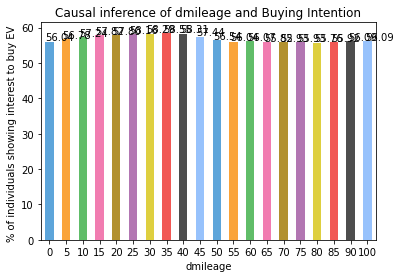

Column name: long_dist
Unique values: [0 1 2 3 4]

The percentage of will buy when feature = long_dist and value = 0 is: 57.35842658528315

The percentage of will buy when feature = long_dist and value = 1 is: 57.98575788402849

The percentage of will buy when feature = long_dist and value = 2 is: 57.10410308579179

The percentage of will buy when feature = long_dist and value = 3 is: 56.52763648694473

The percentage of will buy when feature = long_dist and value = 4 is: 56.018989487962024
   value     column       perc
0      0  long_dist  57.358427
1      1  long_dist  57.985758
2      2  long_dist  57.104103
3      3  long_dist  56.527636
4      4  long_dist  56.018989


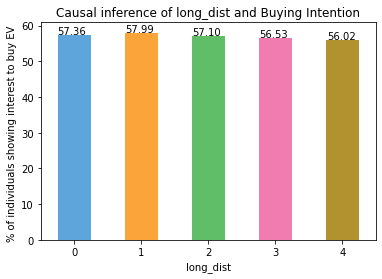

Column name: Age_category
Unique values: [1 2 3 4]

The percentage of will buy when feature = Age_category and value = 1 is: 60.63072227873856

The percentage of will buy when feature = Age_category and value = 2 is: 56.76500508646999

The percentage of will buy when feature = Age_category and value = 3 is: 55.205154289589686

The percentage of will buy when feature = Age_category and value = 4 is: 55.0186503899627
   value        column       perc
0      1  Age_category  60.630722
1      2  Age_category  56.765005
2      3  Age_category  55.205154
3      4  Age_category  55.018650


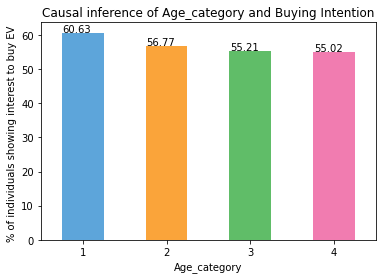

Column name: RUCA
Unique values: [1 2 3 4]

The percentage of will buy when feature = RUCA and value = 1 is: 57.03628348592743

The percentage of will buy when feature = RUCA and value = 2 is: 57.03628348592743

The percentage of will buy when feature = RUCA and value = 3 is: 56.68023058663954

The percentage of will buy when feature = RUCA and value = 4 is: 55.442522889114954
   value column       perc
0      1   RUCA  57.036283
1      2   RUCA  57.036283
2      3   RUCA  56.680231
3      4   RUCA  55.442523


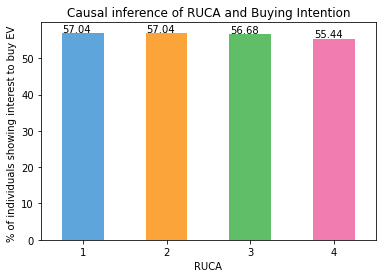

In [87]:
#Causal analysis for Random forest tree 

EV_intention_df = pd.read_csv('AfterMerge_Dataset.csv')

#--------------------------converting nominal variables to categorical variables-------------------------
# Need to change all the variables with multiple classes to 'category'datatype 
EV_intention_df.gender = EV_intention_df.gender.astype('category')
EV_intention_df.state = EV_intention_df.state.astype('category')
EV_intention_df.employment = EV_intention_df.employment.astype('category')
EV_intention_df.hsize = EV_intention_df.hsize.astype('category')
EV_intention_df.housit = EV_intention_df.housit.astype('category')
EV_intention_df.residence = EV_intention_df.residence.astype('category')
EV_intention_df.buycar = EV_intention_df.buycar.astype('category')
EV_intention_df.home_evse = EV_intention_df.home_evse.astype('category')
EV_intention_df.work_evse = EV_intention_df.work_evse.astype('category')
EV_intention_df.town = EV_intention_df.town.astype('category')
EV_intention_df.highway = EV_intention_df.highway.astype('category')
EV_intention_df.home_parking = EV_intention_df.home_parking.astype('category')
EV_intention_df.work_parking = EV_intention_df.work_parking.astype('category')
EV_intention_df.RUCA = EV_intention_df.RUCA.astype('category')
EV_intention_df.Region = EV_intention_df.Region.astype('category')
EV_intention_df.Age_category = EV_intention_df.Age_category.astype('category')
EV_intention_df.education = EV_intention_df.education.astype('category')
EV_intention_df.hsincome = EV_intention_df.hsincome.astype('category')
EV_intention_df.range = EV_intention_df.range.astype('category')
EV_intention_df.bichoice = EV_intention_df.bichoice.astype('category')
column_names = ['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
       'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
       'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
       'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA']
# print(column_names)


#ordinal encoding of state
ordinal_encoded_columns= ['state']

ordinal_encoder = OrdinalEncoder(categories='auto')
ordinal_encoded_data = ordinal_encoder.fit_transform(EV_intention_df[ordinal_encoded_columns])

#Convert it to df
ordinal_encoded_data_df = pd.DataFrame(ordinal_encoded_data, index=EV_intention_df.index,columns=['state'])

# #Extract only the columns that didnt need to be encoded
data_other_cols = EV_intention_df.drop(columns=ordinal_encoded_columns)

# #Concatenate the two dataframes : 
EV_intention_df = pd.concat([ordinal_encoded_data_df, data_other_cols], axis=1)
print(EV_intention_df)
EV_intention_df.shape

#converting state to categorical
EV_intention_df.state = EV_intention_df.state.astype('category')
old_df = pd.DataFrame()
avg_prediction_arr=[]



for col in column_names:
#     print(i)
    print(f"Column name: {col}")
#passing values of the column into an array
    col_values= EV_intention_df[col]
#     print('column original values')
#     print(col)
    temp = col_values.copy()
    
#finding unique values within the category and passing them into an array
    unique_values = np.unique(col_values)
    print(f"Unique values: {unique_values}")
    # df = pd.DataFrame()
    df = pd.DataFrame()

    # Iterate over the values
    for i, val in enumerate(unique_values):
    # Replace the elements in the array with the current value
        Y = X.iloc[:, i].values
        #print val
        #print(val)
        col_values[:] = val

        #print(col)
        X = EV_intention_df.drop(columns=['bichoice','zipcode'])
        #print(X)
        y = EV_intention_df['bichoice']
         #--------------------------------------standardization-----------------------------------
        EVNorm1 = pd.concat([pd.DataFrame(scaler.transform(X[['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
        'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
        'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
        'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA','state']]), 
                                    columns=['zrange', 'zhome_chg', 'zwork_chg', 'ztown', 'zhighway', 'zgender', 'zRegion',
        'zeducation', 'zemployment', 'zhsincome', 'zhsize', 'zhousit', 'zresidence',
        'zall_cars', 'zev_cars', 'zhome_parking', 'zhome_evse', 'zwork_parking',
        'zwork_evse', 'zbuycar', 'zdmileage', 'zlong_dist', 'zAge_category', 'zRUCA','zstate'],index=X.index),
                       X ], axis=1)

        #print('Standardized (Normalized) Values of EV Intention Data Set')
        print()
        data_scaled1 = EVNorm1.drop(columns= ['range', 'home_chg', 'work_chg', 'town', 'highway', 'gender', 'Region',
        'education', 'employment', 'hsincome', 'hsize', 'housit', 'residence',
        'all_cars', 'ev_cars', 'home_parking', 'home_evse', 'work_parking',
        'work_evse', 'buycar', 'dmileage', 'long_dist', 'Age_category', 'RUCA','state'])
        # print(data_scaled1)
        # print(data_scaled1.shape)
        

        prediction = rf.predict(data_scaled1)
        avg_prediction = np.average(prediction)
        avg_prediction= avg_prediction*100

        print(f'The percentage of will buy when feature = {col} and value = {val} is: {avg_prediction}')
        old_df = pd.DataFrame({'value':[val], 'column': [col], 'perc': [avg_prediction]})
        df = pd.concat([df, old_df], ignore_index=True)
    print(df)

    colors = ['#5DA5DA', '#FAA43A', '#60BD68', '#F17CB0', '#B2912F', '#B276B2', '#DECF3F', '#F15854', '#4D4D4D', '#97C2FC']
    ax= df.plot.bar(x='value', y='perc', rot =0,color = colors)
    # Display the values on top of the bars
    for p in ax.patches:
        value = "{:.2f}".format(p.get_height())
        ax.annotate(value, (p.get_x() * 1.005, p.get_height() * 1.005))
 

    
     # Add labels and legend
    ax.set_ylabel('% of individuals showing interest to buy EV ')
    ax.set_xlabel(col)
    ax.set_title(f'Causal inference of {col} and Buying Intention')
    ax.legend().set_visible(False) # hide the legend
    plt.show()
    

    col_values[:] = temp




